In [2]:
from google.colab import files
uploaded = files.upload()  # Upload your ZIP file here

import zipfile
import os

zip_path = list(uploaded.keys())[0]
extract_path = "/content/dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset extracted to:", extract_path)

Saving yolov5-master.zip to yolov5-master.zip
✅ Dataset extracted to: /content/dataset


In [3]:
import os

for root, dirs, files in os.walk("/content/dataset"):
    level = root.replace("/content/dataset", "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = " " * 2 * (level + 1)
    for f in files:
        print(f"{subindent}{f}")

dataset/
  yolov5-master/
    detect.py
    pyproject.toml
    CONTRIBUTING.md
    README.md
    .dockerignore
    CITATION.cff
    val.py
    .DS_Store
    LICENSE
    train.py
    .gitattributes
    benchmarks.py
    hubconf.py
    tutorial.ipynb
    .gitignore
    README.zh-CN.md
    export.py
    requirements.txt
    utils/
      metrics.py
      callbacks.py
      loss.py
      torch_utils.py
      augmentations.py
      dataloaders.py
      downloads.py
      plots.py
      __init__.py
      .DS_Store
      activations.py
      autoanchor.py
      triton.py
      general.py
      autobatch.py
      segment/
        metrics.py
        loss.py
        augmentations.py
        dataloaders.py
        plots.py
        __init__.py
        general.py
      aws/
        resume.py
        __init__.py
        userdata.sh
        mime.sh
      google_app_engine/
        additional_requirements.txt
        Dockerfile
        app.yaml
      loggers/
        __init__.py
        comet/
        

In [4]:
# STEP 1: Clone YOLOv5 repo (if not already done)
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17413, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 17413 (delta 64), reused 22 (delta 22), pack-reused 17327 (from 4)
Receiving objects: 100% (17413/17413), 16.31 MiB | 24.89 MiB/s, done.
Resolving deltas: 100% (11932/11932), done.
/content/yolov5


In [10]:
!bash yolov5/data/scripts/get_coco128.sh

bash: yolov5/data/scripts/get_coco128.sh: No such file or directory


In [12]:
from google.colab import files
uploaded = files.upload()  # Upload your ZIP file here

Saving coco128.zip to coco128.zip


In [13]:
!unzip coco128.zip -d /content/yolov5/data/

Archive:  coco128.zip
   creating: /content/yolov5/data/coco128/
  inflating: /content/yolov5/data/__MACOSX/._coco128  
  inflating: /content/yolov5/data/coco128/.DS_Store  
  inflating: /content/yolov5/data/__MACOSX/coco128/._.DS_Store  
  inflating: /content/yolov5/data/coco128/LICENSE  
  inflating: /content/yolov5/data/__MACOSX/coco128/._LICENSE  
   creating: /content/yolov5/data/coco128/images/
  inflating: /content/yolov5/data/__MACOSX/coco128/._images  
   creating: /content/yolov5/data/coco128/labels/
  inflating: /content/yolov5/data/__MACOSX/coco128/._labels  
  inflating: /content/yolov5/data/coco128/README.txt  
  inflating: /content/yolov5/data/__MACOSX/coco128/._README.txt  
  inflating: /content/yolov5/data/coco128/images/.DS_Store  
  inflating: /content/yolov5/data/__MACOSX/coco128/images/._.DS_Store  
   creating: /content/yolov5/data/coco128/images/train2017/
  inflating: /content/yolov5/data/__MACOSX/coco128/images/._train2017  
  inflating: /content/yolov5/data/co

In [14]:
!ls -R /content/yolov5/data/coco128/

/content/yolov5/data/coco128/:
images	labels	LICENSE  README.txt

/content/yolov5/data/coco128/images:
train2017

/content/yolov5/data/coco128/images/train2017:
000000000009.jpg  000000000154.jpg  000000000370.jpg  000000000529.jpg
000000000025.jpg  000000000164.jpg  000000000382.jpg  000000000531.jpg
000000000030.jpg  000000000165.jpg  000000000384.jpg  000000000532.jpg
000000000034.jpg  000000000192.jpg  000000000387.jpg  000000000536.jpg
000000000036.jpg  000000000194.jpg  000000000389.jpg  000000000540.jpg
000000000042.jpg  000000000196.jpg  000000000394.jpg  000000000542.jpg
000000000049.jpg  000000000201.jpg  000000000395.jpg  000000000544.jpg
000000000061.jpg  000000000208.jpg  000000000397.jpg  000000000560.jpg
000000000064.jpg  000000000241.jpg  000000000400.jpg  000000000562.jpg
000000000071.jpg  000000000247.jpg  000000000404.jpg  000000000564.jpg
000000000072.jpg  000000000250.jpg  000000000415.jpg  000000000569.jpg
000000000073.jpg  000000000257.jpg  000000000419.jpg  0000

In [16]:
!find /content/yolov5/data/coco128/ -type d -name '__MACOSX'
!find /content/yolov5/data/coco128/ -type f -name '._*'

In [21]:
!python /content/yolov5/train.py --img 640 --batch 16 --epochs 10 --data /content/yolov5/data/coco128.yaml --weights yolov5s.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-30 15:02:50.807164: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746025370.843490   11906 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746025370.854846   11906 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data/coco128.yaml, hyp=d

In [22]:
!python train.py --resume

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-30 15:48:31.808352: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746028112.132221   22803 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746028112.214027   22803 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=, data=data/coco128.yaml, hyp=data/hyps/hyp.scr

In [25]:
!ls runs/train/

exp  exp2


In [26]:
!ls runs/train/exp*/weights/

runs/train/exp2/weights/:
best.pt  last.pt

runs/train/exp/weights/:


In [29]:
from google.colab import files
uploaded = files.upload()

Saving IMG_3604.JPG to IMG_3604 (1).JPG


In [31]:
!ls runs/detect/

exp  exp2  exp3


In [35]:
from google.colab import files
uploaded = files.upload()

Saving IMG_3604.JPG to IMG_3604 (2).JPG


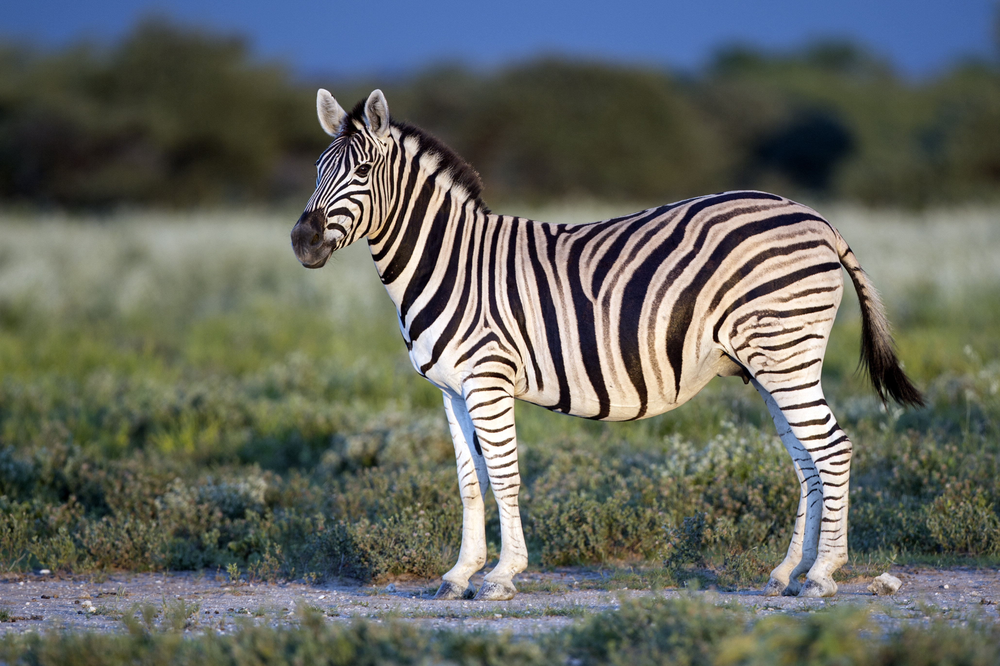

In [36]:
from IPython.display import Image, display
display(Image(filename='IMG_3604.JPG'))

In [37]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.25 --source IMG_3604.JPG

detect: weights=['runs/train/exp2/weights/best.pt'], source=IMG_3604.JPG, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.12 torch-2.6.0+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 /content/yolov5/IMG_3604.JPG: 448x640 1 zebra, 333.4ms
Speed: 3.1ms pre-process, 333.4ms inference, 2.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4


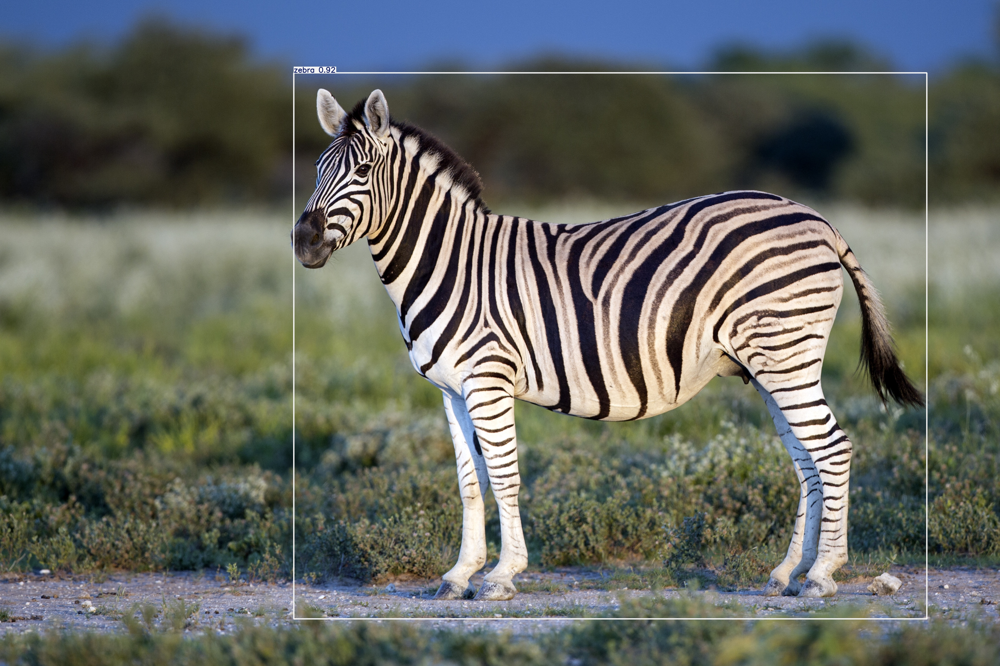

In [38]:
from IPython.display import Image, display
display(Image(filename='runs/detect/exp4/IMG_3604.JPG'))

In [49]:
from google.colab import files
files.download('runs/train/exp2/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>